In [3]:
import numpy as np
import nibabel as nib
import h5py
import matplotlib.pylab as plt
import sys
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
sys.path.append('../../src/')

from tqdm import tqdm
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# custom scripts
import mri_cs
from visualization import plot_batch
from helpers import signal_to_error

layout = go.Layout(template="plotly_dark")
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'
plt.style.use('dark_background')

py.init_notebook_mode()

In [4]:
DATA_PATH = '../../data/'
FILE_SAMPLE = DATA_PATH + 'file_brain_AXFLAIR_200_6002441.h5'

hf = h5py.File(FILE_SAMPLE, mode='r')
list(hf.keys())
dict(hf.attrs)

['ismrmrd_header', 'kspace', 'mask']

{'acceleration': 8,
 'acquisition': 'AXFLAIR',
 'num_low_frequency': 13,
 'patient_id': 'ca18fce12f2549e69a2db3c660a4d27b116cd79c6ee2437a15db40db7379c723'}

In [5]:
volume_kspace = hf['kspace'][()]
volume_kspace.shape
volume_kspace.dtype

(16, 20, 640, 320)

dtype('complex64')

(20, 640, 320)

204800

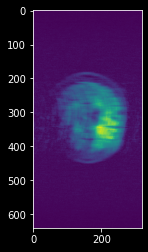

In [8]:
slice_kspace = volume_kspace[3]
slice_kspace.shape

rows = 640
cols = 320
image_size = rows * cols
image_size
_ = plt.imshow(np.abs(np.fft.fftshift(np.fft.ifft2(slice_kspace[14]))))

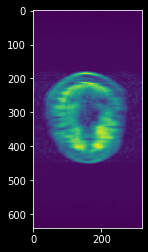

In [7]:
def rms(data):
    data = np.fft.ifftshift(data)
    data = np.fft.ifft2(data)
    data = np.fft.fftshift(data)
    s_rms = np.sqrt((data ** 2).sum(0))
    return s_rms

combined_slice_rms = rms(slice_kspace)
_ = plt.imshow(np.abs(combined_slice_rms))

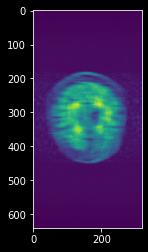

In [8]:
def combine_coils_rss(data, dim=0):
    data = np.fft.ifftshift(data)
    data = np.fft.ifft2(data)
    data = np.fft.fftshift(data)
    # Root Sum of Squares RSS    
    data = np.sqrt((data ** 2)).sum(dim)
    return data

combined_slice_rss = combine_coils_rss(slice_kspace)
_ = plt.imshow(np.abs(combined_slice_rss))

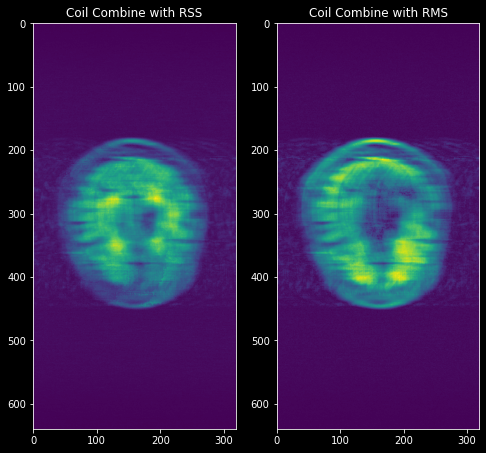

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 15))
_ = axes[0].imshow(np.abs(combined_slice_rss))
_ = axes[0].set_title('Coil Combine with RSS')
_ = axes[1].imshow(np.abs(combined_slice_rms))
_ = axes[1].set_title('Coil Combine with RMS')

# Extract samples rows measurements from kspace coil sample

In [10]:
def get_indices(arr: np.array) -> np.array:
    arr = arr.flatten()
    indices = np.where(arr != 0)[0]
    nonzero_perc = indices.size / arr.size
    print(f'{nonzero_perc:.2f}% non zero elements')
    return indices

samples_rows = get_indices(slice_kspace[0])
samples_rows.size
samples_rows

0.10% non zero elements


20480

array([    48,     60,     71, ..., 204722, 204733, 204745])

In [11]:
Bs = np.array([coil_sample.flatten()[samples_rows] for coil_sample in slice_kspace]) 
Bs.size
Bs.shape
Bs[0].shape
Bs[0]

409600

(20, 20480)

(20480,)

array([ 3.0549709e-06+1.0805670e-06j, -2.1406449e-06+5.5111013e-07j,
       -7.1432441e-07-2.2647437e-06j, ..., -1.4337711e-06+5.5450946e-06j,
        5.6629069e-06+1.5061814e-06j, -9.4324350e-06-6.0016755e-06j],
      dtype=complex64)

In [14]:
A_ = lambda x: np.fft.fft2(np.reshape(x, (rows, cols))).flatten()[samples_rows]
stacked_image_size = rows * cols

def ah(x):
    x = fill_with_zeros(x, samples_rows, stacked_image_size)
    x = np.fft.ifft2(x)
    x = x * (stacked_image_size)
    x = x.flatten()
    return x

def fill_with_zeros(x, samples_rows, stacked_image_size):
    y = np.zeros((stacked_image_size), dtype=complex)

    y[samples_rows] = x
    y = np.reshape(y, (rows, cols))
    return y

# Reconstruct each coil sample

In [13]:
reconstructed_imgs = []
img_size = rows * cols

for b in tqdm(Bs):
    recon_img = mri_cs.lpminimization(A_, Ah=ah, b=b, p=1, N=(img_size), verbose=False)
    reconstructed_imgs.append(recon_img)

100%|██████████| 20/20 [00:52<00:00,  2.63s/it]


# One coil plot

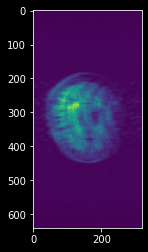

In [15]:
_ = plt.imshow(np.abs(np.fft.fftshift(np.reshape(reconstructed_imgs[5], (rows, cols)))))

# All coils combined plot

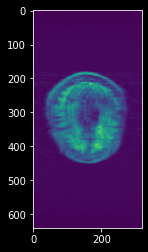

In [25]:
reconstructed_imgs = [np.reshape(i, (rows, cols)) for i in reconstructed_imgs]

def rms(data):
#     data = np.fft.ifftshift(data)
#     data = np.fft.ifft2(data)
    data = np.fft.fftshift(data)
    s_rms = np.sqrt((data ** 2).sum(0))
    return s_rms

combined_reconstructed = rms(reconstructed_imgs)
_ = plt.imshow(np.abs(combined_reconstructed))

# Plain IFFT2 vs. CS

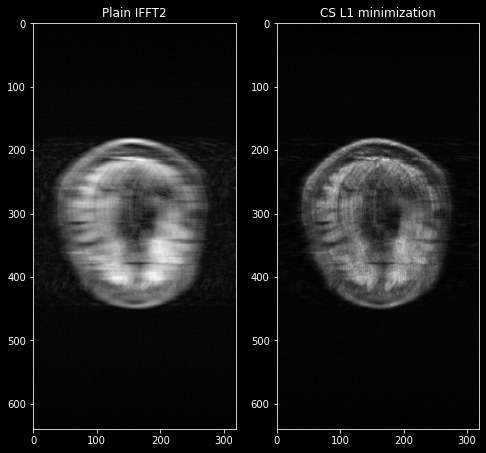

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 15))
_ = axes[0].imshow(np.abs(combined_slice_rms), cmap='gray')
_ = axes[0].set_title('Plain IFFT2')
_ = axes[1].imshow(np.abs(combined_reconstructed), cmap='gray')
_ = axes[1].set_title('CS L1 minimization')

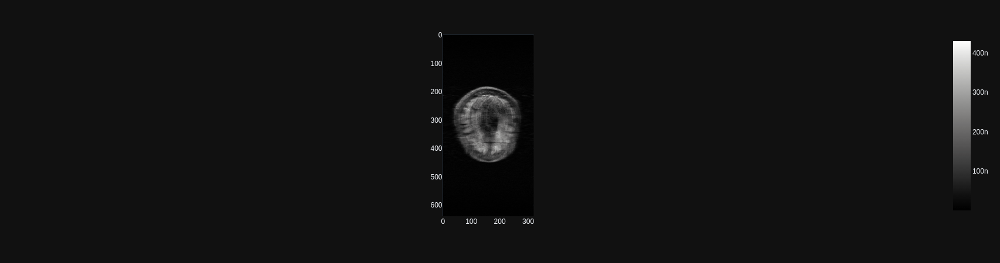

In [28]:
px.imshow(np.abs(combined_reconstructed), color_continuous_scale='gray')